In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

Generator

In [ ]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [ ]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU

    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


In [ ]:

# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them!
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)

    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [ ]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()

    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!








noise


In [ ]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [ ]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)

    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


Discriminator

In [ ]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation
          followed by an nn.LeakyReLU activation with negative slope of 0.2
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
         nn.Linear(input_dim, output_dim), #Layer 1
         nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [ ]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)

    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


In [ ]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor,
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)

    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [ ]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):

    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


Training

In [ ]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare
               the discriminator's predictions to the ground truth reality of the images
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce,
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images.
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a
    #            'ground truth' tensor in order to calculate the loss.
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [ ]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data

        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [ ]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare
               the discriminator's predictions to the ground truth reality of the images
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce,
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images.
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [ ]:
def test_gen_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)


def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)

    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.461949547290803, discriminator loss: 0.23876431924104682


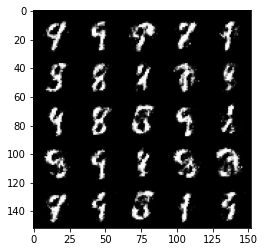

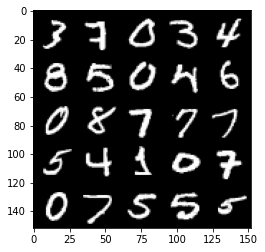

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.544645671367644, discriminator loss: 0.23157955157756807


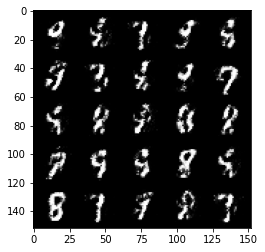

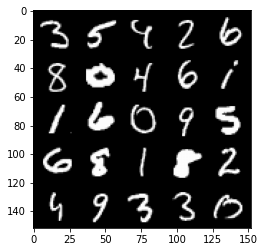

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.44559099149704, discriminator loss: 0.23983021417260172


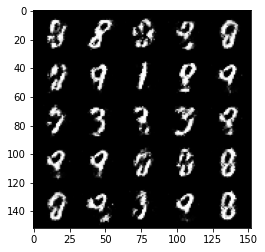

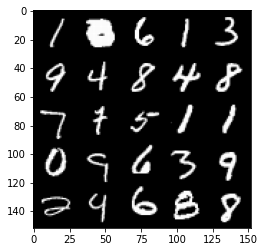

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.4963071804046644, discriminator loss: 0.23000114464759822


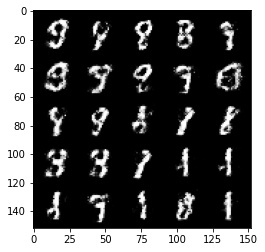

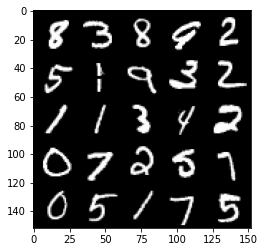

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.4358871812820455, discriminator loss: 0.24222011250257497


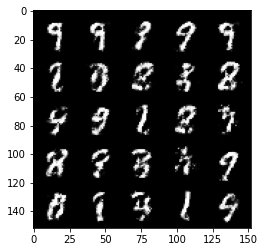

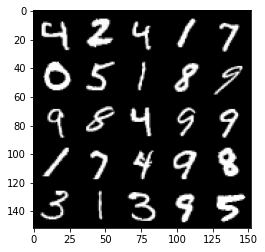

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.3913564059734345, discriminator loss: 0.24771418800950049


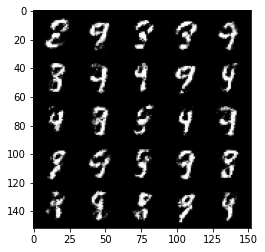

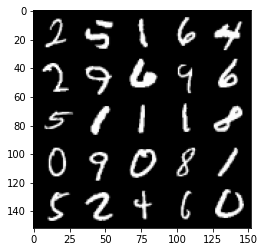

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.360376604795457, discriminator loss: 0.26070322361588466


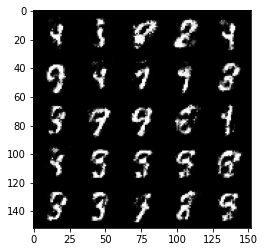

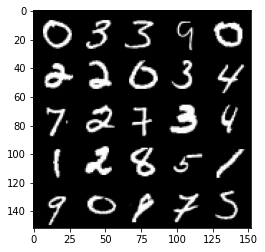

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.2724569036960607, discriminator loss: 0.265550680756569


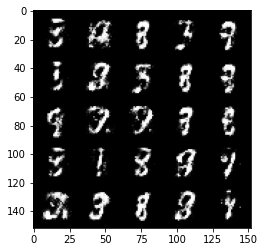

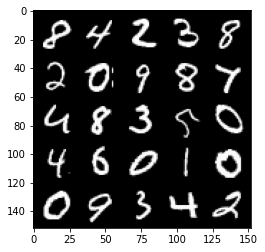

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.289578892230986, discriminator loss: 0.2731129060387612


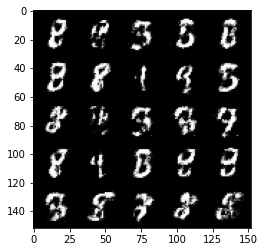

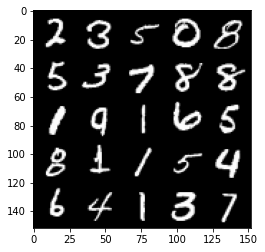

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.2857749969959285, discriminator loss: 0.279593466550112


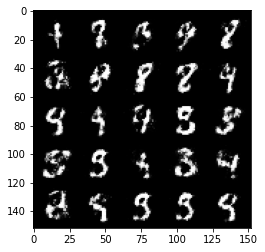

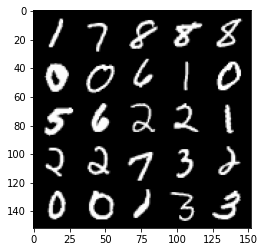

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.1889960730075844, discriminator loss: 0.2904983182549476


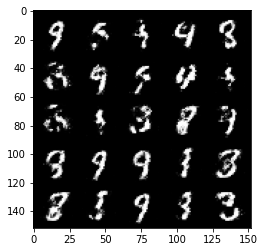

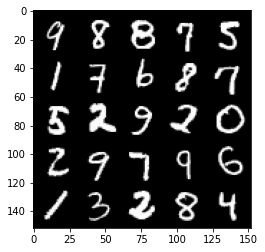

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.3124566190242772, discriminator loss: 0.26378594300150876


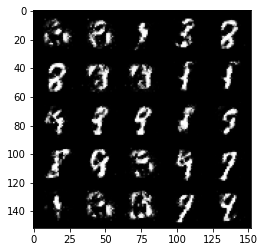

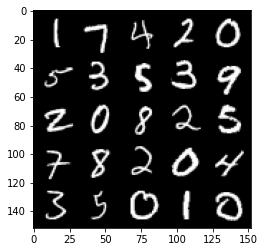

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.325976805686952, discriminator loss: 0.2683359342515471


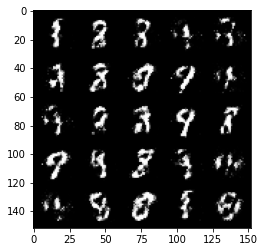

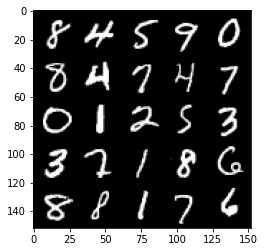

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.3294969968795773, discriminator loss: 0.2659518227875231


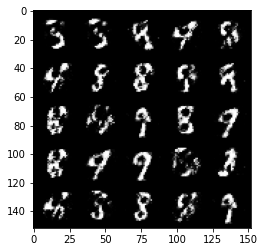

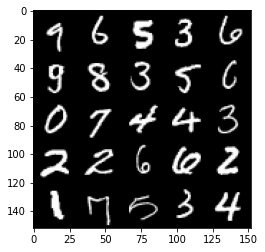

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.2504097034931183, discriminator loss: 0.2665962560772893


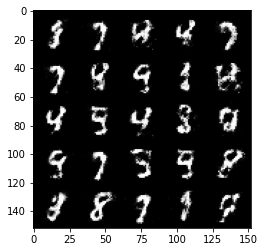

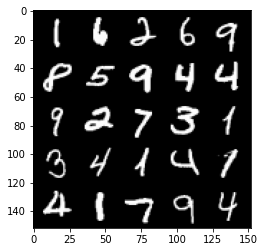

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.2606220371723165, discriminator loss: 0.2768807448148729


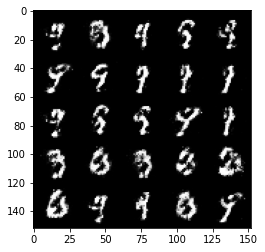

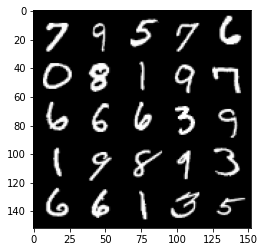

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.1409834372997296, discriminator loss: 0.30436233463883405


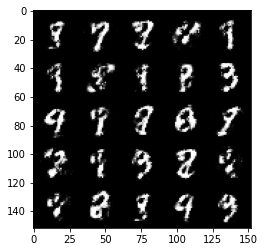

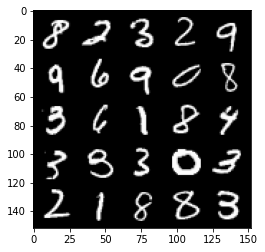

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.108821416378022, discriminator loss: 0.2887883879840374


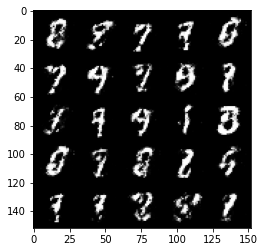

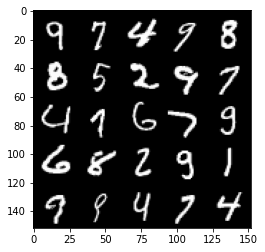

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.1895247652530663, discriminator loss: 0.28711702316999477


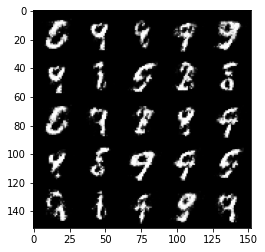

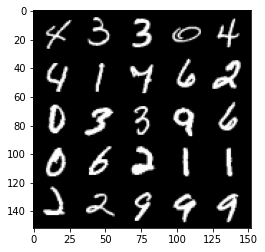

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.2151112284660326, discriminator loss: 0.27425485259294535


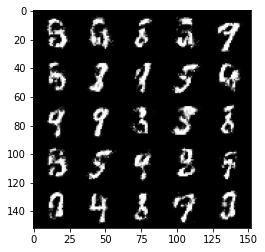

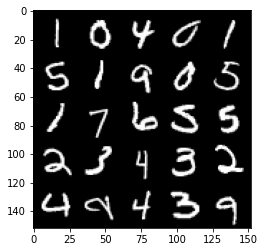

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.1798210871219634, discriminator loss: 0.28053310835361506


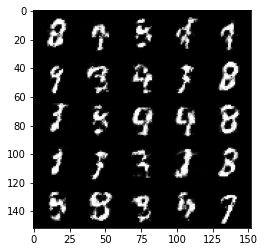

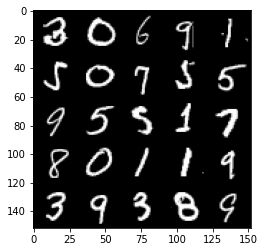

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.103277303695679, discriminator loss: 0.297538881242275


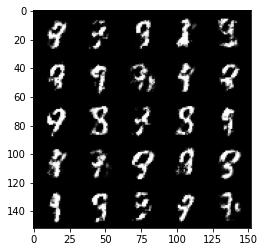

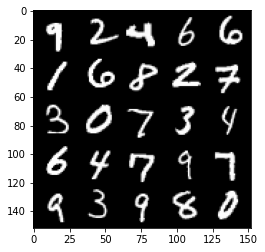

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 1.9717187190055838, discriminator loss: 0.3176535347700118


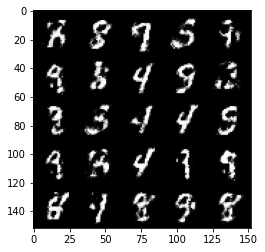

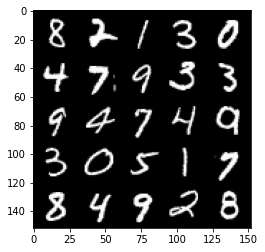

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.12804703760147, discriminator loss: 0.30339348486065854


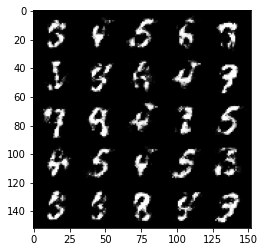

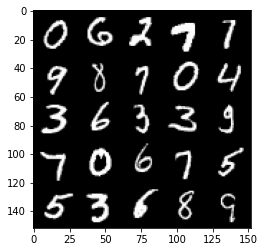

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.051256412982939, discriminator loss: 0.3124866679906849


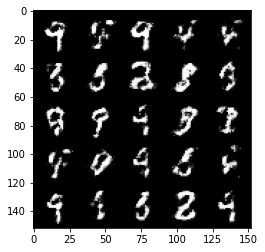

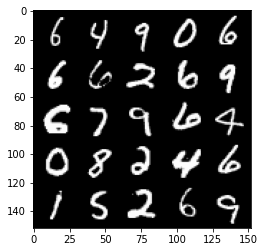

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 1.9983210308551804, discriminator loss: 0.3196654910147191


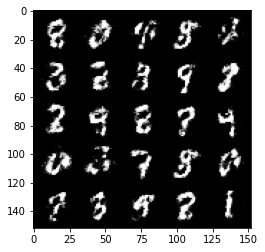

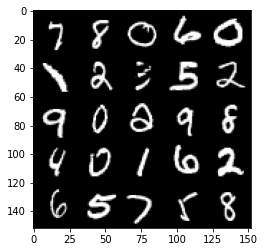

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 1.9032119457721683, discriminator loss: 0.33996726062893895


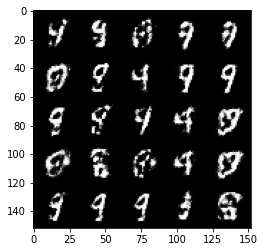

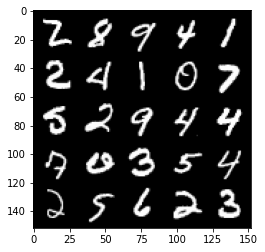

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.013551313400268, discriminator loss: 0.3118935104310513


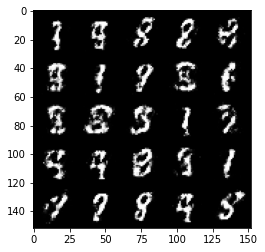

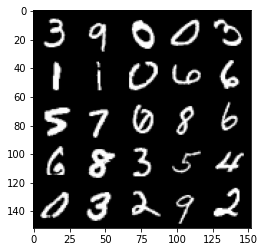

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 1.9584971199035641, discriminator loss: 0.3245328567326069


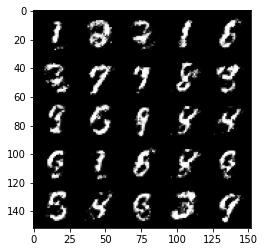

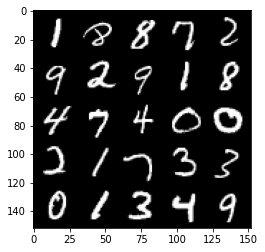

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 1.908848792314529, discriminator loss: 0.33212139570713023


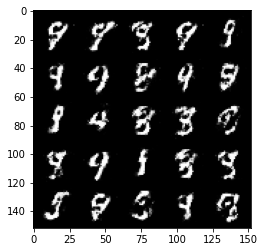

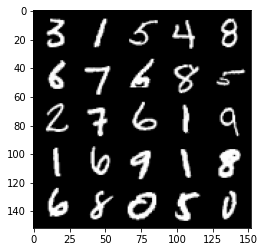

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 1.8321498351097103, discriminator loss: 0.35114470571279555


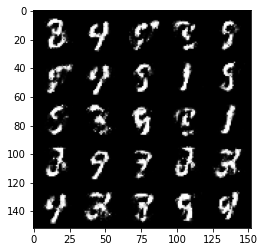

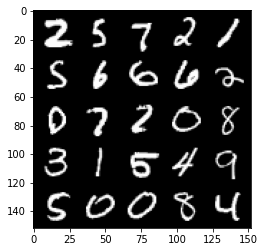

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 1.8288979823589313, discriminator loss: 0.345794112086296


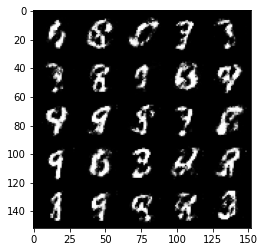

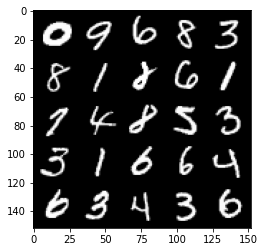

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 1.7744665935039519, discriminator loss: 0.35762238752841957


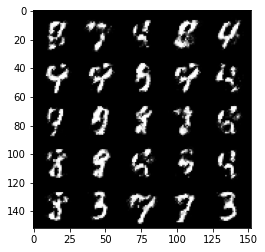

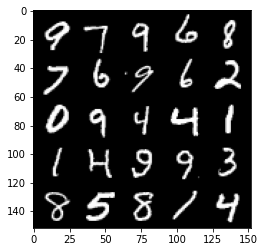

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 1.8282932248115544, discriminator loss: 0.33251296615600556


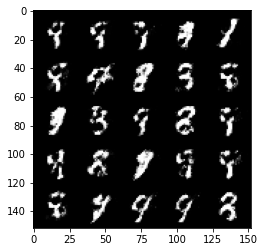

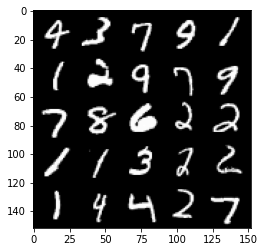

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 1.973609235048292, discriminator loss: 0.3142739046812058


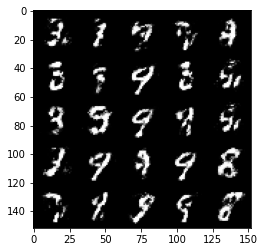

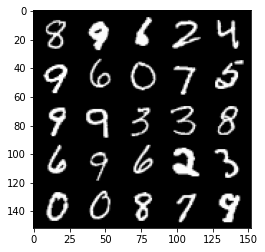

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 1.8941872546672835, discriminator loss: 0.3294470740258692


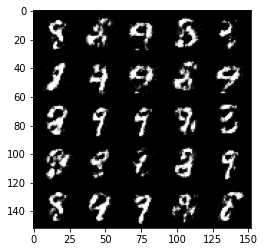

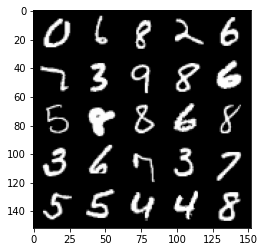

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 1.867752343893051, discriminator loss: 0.3422421398162843


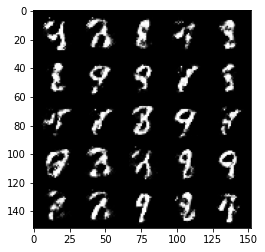

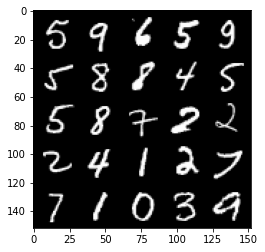

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 1.902532027482987, discriminator loss: 0.3190726908743381


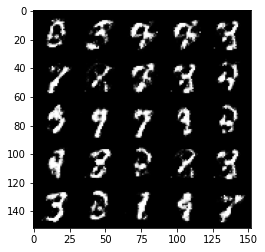

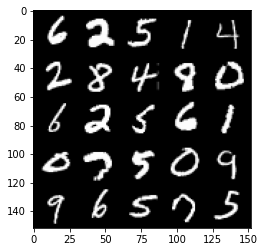

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 1.87487194943428, discriminator loss: 0.34639188185334197


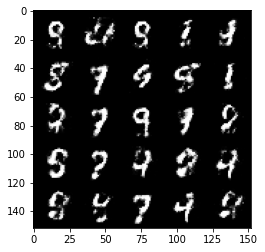

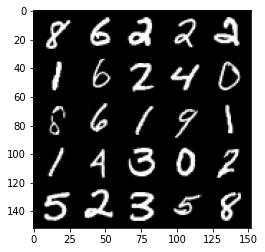

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.7296575539112087, discriminator loss: 0.3683465107083322


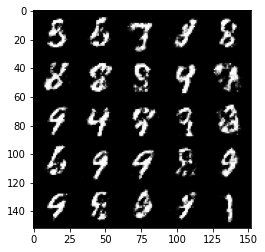

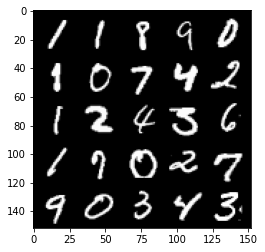

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 1.8146903626918804, discriminator loss: 0.3499344415068622


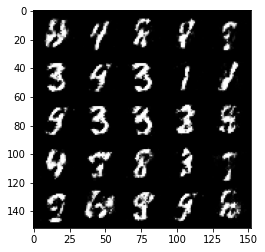

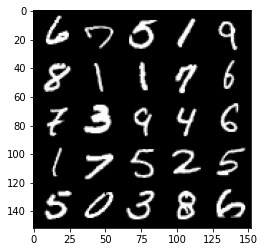

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.7242501518726334, discriminator loss: 0.3734785829782485


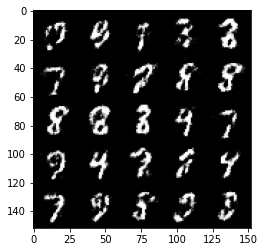

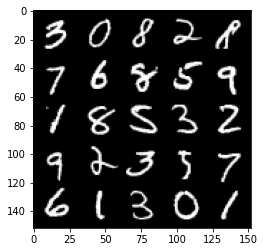

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 1.6935546317100525, discriminator loss: 0.38424401539564096


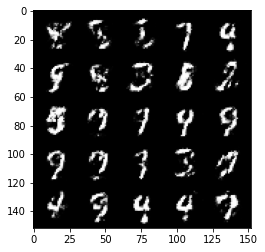

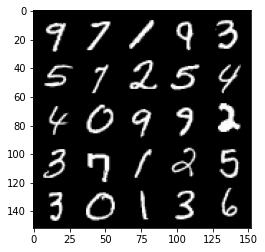

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.5627079846858978, discriminator loss: 0.40800372338294955


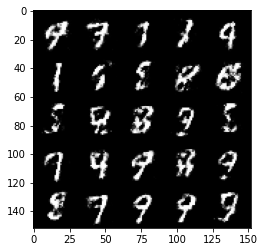

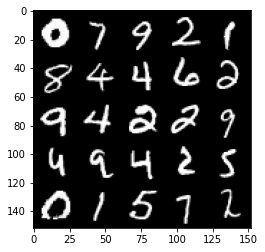

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 1.589655658006667, discriminator loss: 0.40350061947107285


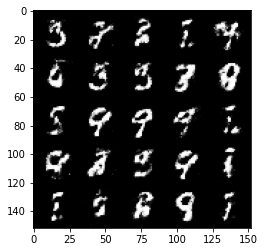

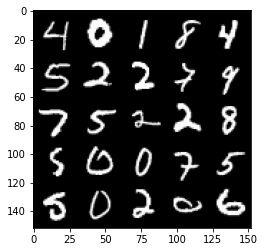

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 1.5948055777549748, discriminator loss: 0.39191271746158607


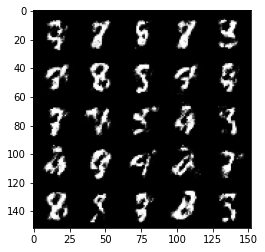

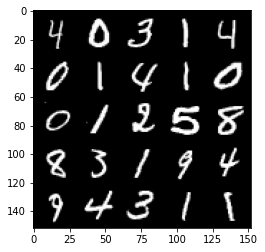

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 1.6829290626049034, discriminator loss: 0.37674231570959105


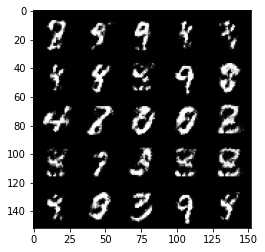

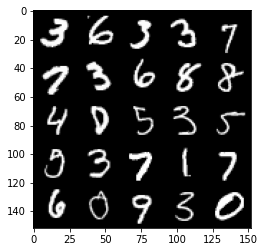

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.6508822226524345, discriminator loss: 0.3958740848898889


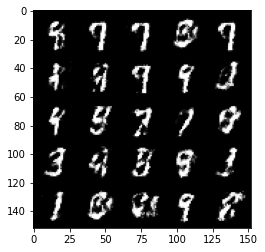

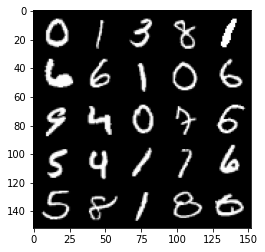

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 1.671685620069503, discriminator loss: 0.3742542006373409


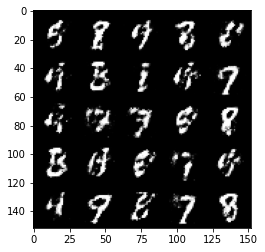

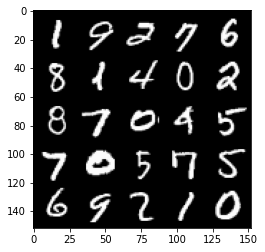

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.6859123659133899, discriminator loss: 0.3769365859031681


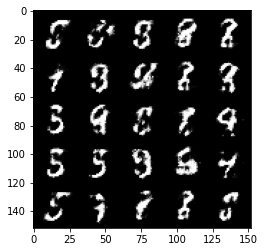

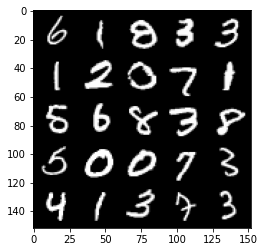

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 1.663690747976304, discriminator loss: 0.37838414806127557


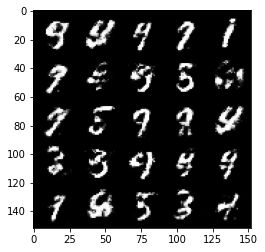

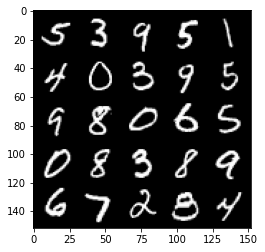

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.5608466570377362, discriminator loss: 0.4103173027634621


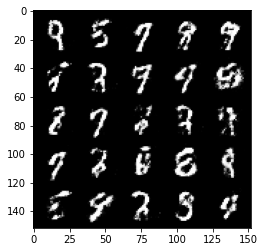

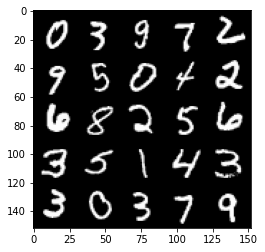

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 1.5846062667369842, discriminator loss: 0.3836903081536292


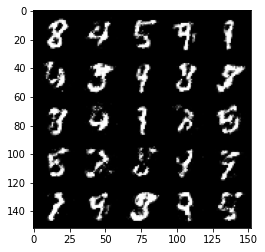

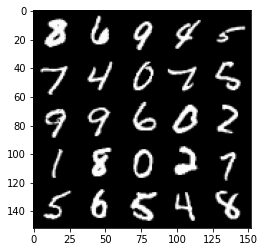

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.595265806913376, discriminator loss: 0.39862094217538824


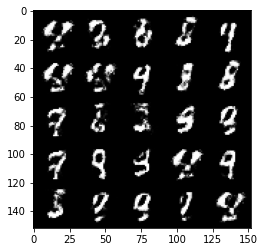

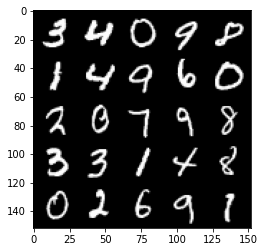

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 1.5145850987434373, discriminator loss: 0.41466734606027655


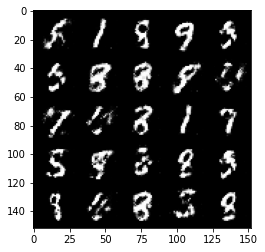

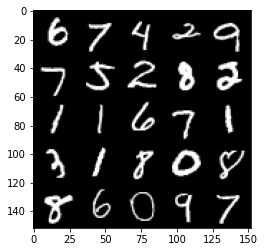

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.4732524094581605, discriminator loss: 0.42602007466554603


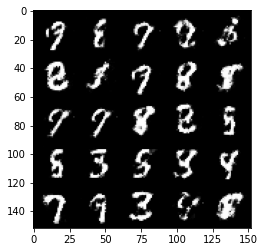

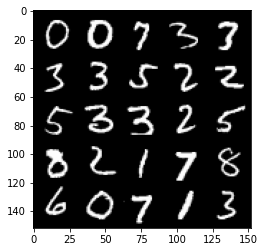

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 1.46114063835144, discriminator loss: 0.42974284589290607


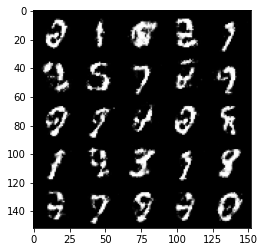

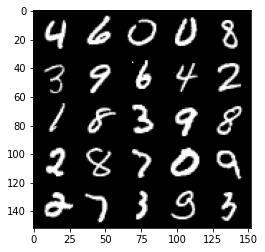

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.4478214430809029, discriminator loss: 0.4259174897074702


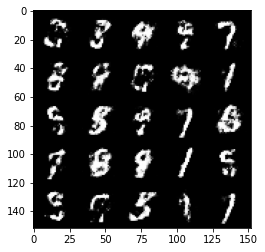

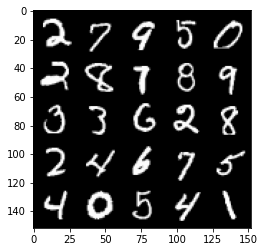

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 1.390961139440537, discriminator loss: 0.45064882355928365


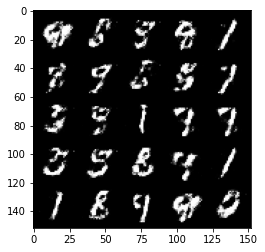

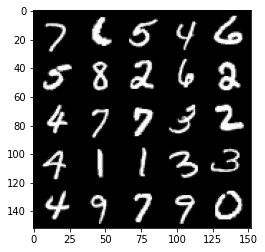

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.4548094484806058, discriminator loss: 0.4309664689302446


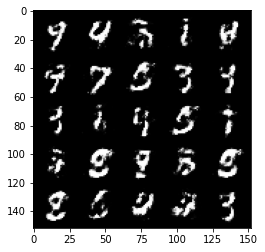

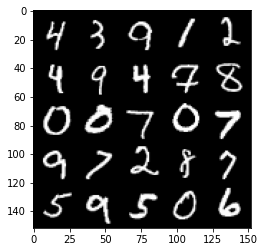

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 1.3598474252223984, discriminator loss: 0.4532534412741665


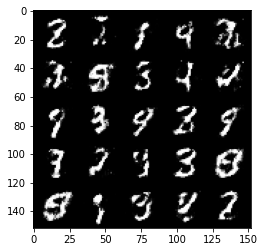

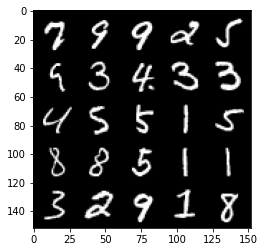

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.491943799495697, discriminator loss: 0.41716498070955327


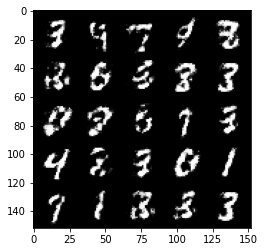

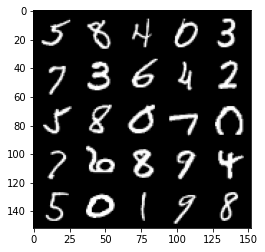

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 1.392612272262574, discriminator loss: 0.4528874575495717


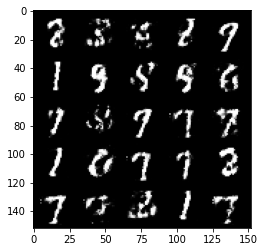

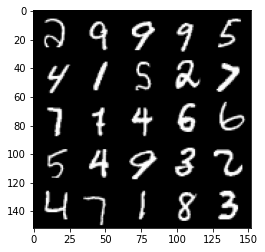

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.4241239488124855, discriminator loss: 0.4453493877053263


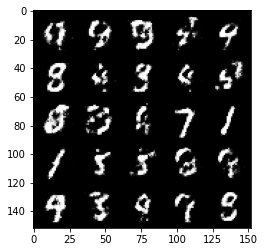

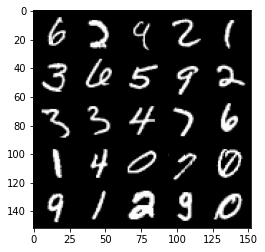

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500: Generator loss: 1.3376525437831885, discriminator loss: 0.4737854124307637


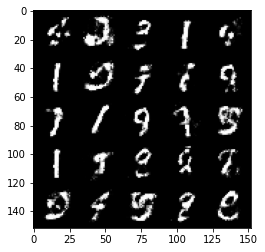

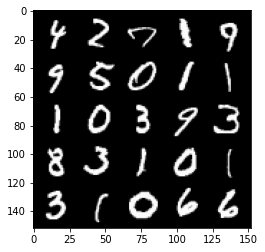

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 1.340407590150834, discriminator loss: 0.4482479556798933


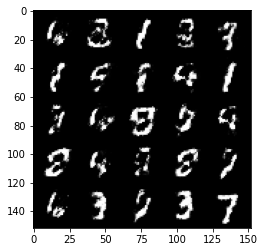

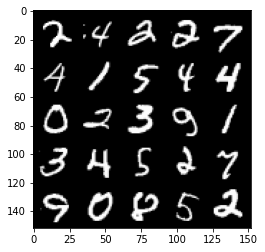

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500: Generator loss: 1.4557926280498519, discriminator loss: 0.4206050859093665


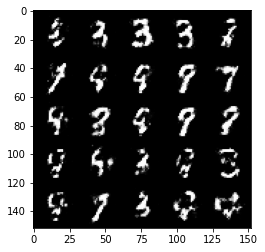

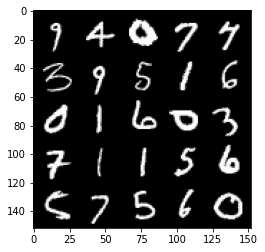

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 1.434314692497254, discriminator loss: 0.4331519879102703


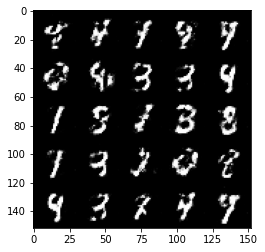

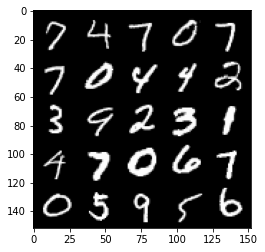

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500: Generator loss: 1.3723181512355798, discriminator loss: 0.46691979378461834


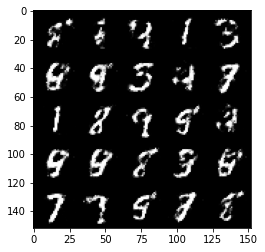

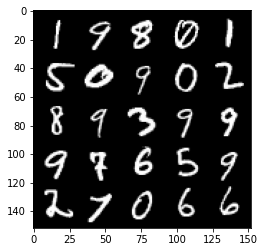

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 1.3841850304603565, discriminator loss: 0.44298608392477046


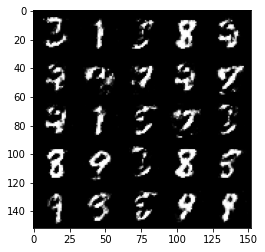

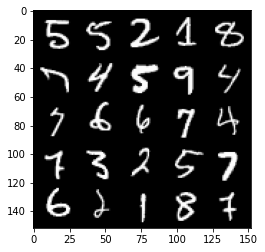

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500: Generator loss: 1.384908570051195, discriminator loss: 0.44700851219892507


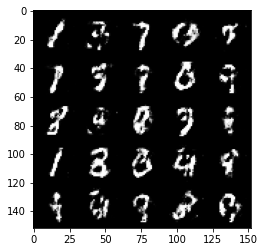

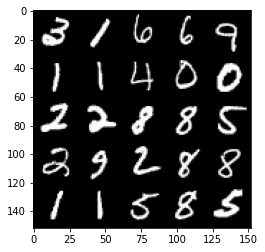

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 1.3462609486579902, discriminator loss: 0.46683811569213884


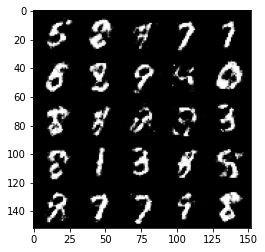

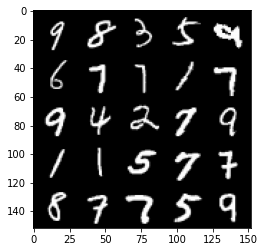

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500: Generator loss: 1.324667512178421, discriminator loss: 0.46925443762540847


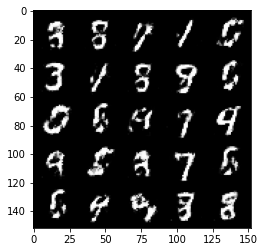

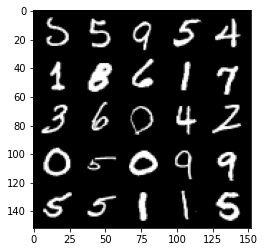

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 1.3639570624828343, discriminator loss: 0.44986278015375136


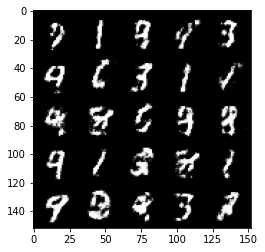

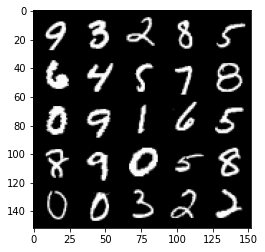

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500: Generator loss: 1.333004593610763, discriminator loss: 0.4600352339744563


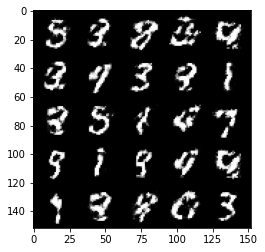

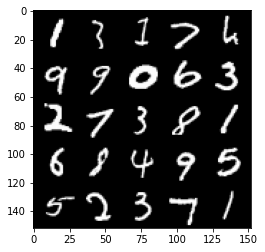

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 1.4397441418170922, discriminator loss: 0.4359294003248211


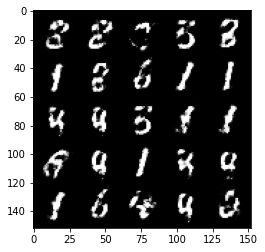

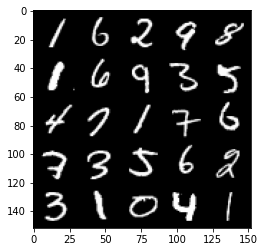

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500: Generator loss: 1.3925723495483384, discriminator loss: 0.44144820517301575


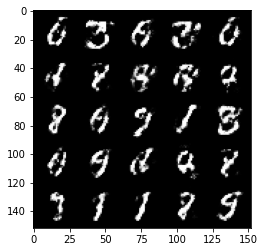

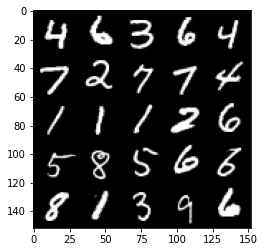

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 1.347073079586029, discriminator loss: 0.46158952009677895


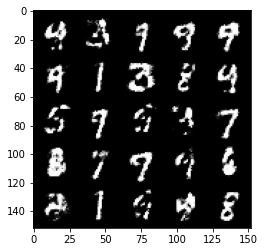

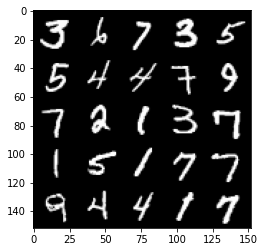

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500: Generator loss: 1.3222952625751478, discriminator loss: 0.46519753700494776


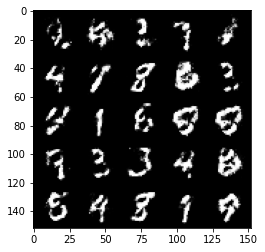

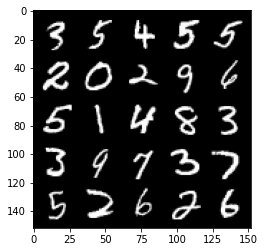

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 1.2660876488685584, discriminator loss: 0.479611759603023


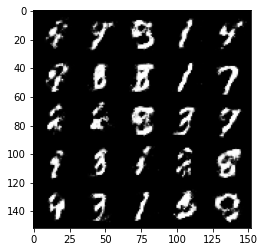

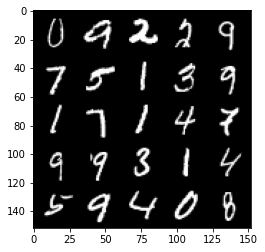

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500: Generator loss: 1.259870397806167, discriminator loss: 0.47203801697492537


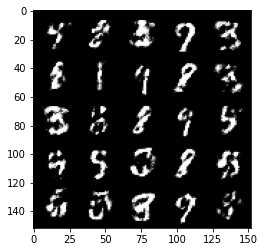

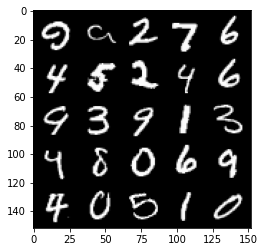

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 1.3199054126739511, discriminator loss: 0.46795711135864226


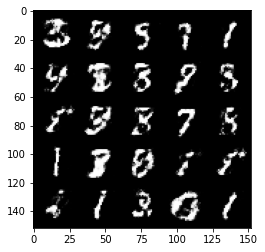

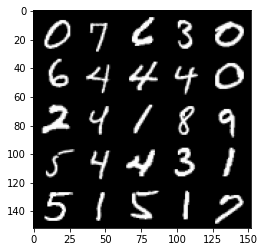

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500: Generator loss: 1.2769353494644162, discriminator loss: 0.4795340003967286


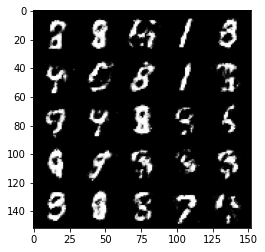

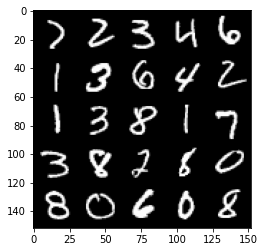

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 1.2277699558734898, discriminator loss: 0.4964912849664692


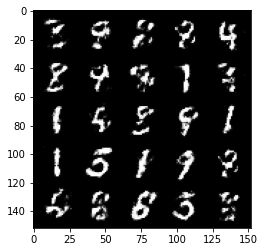

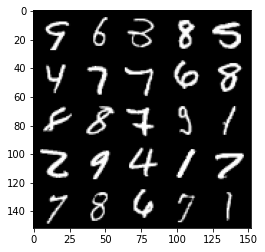

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500: Generator loss: 1.2558766286373149, discriminator loss: 0.4843726373314861


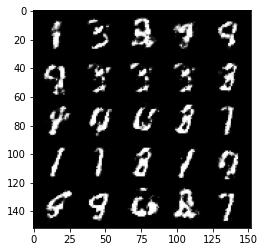

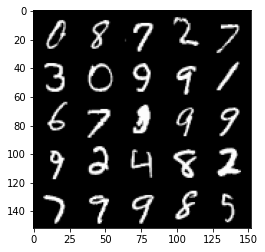

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 1.270189604759216, discriminator loss: 0.4813594194650651


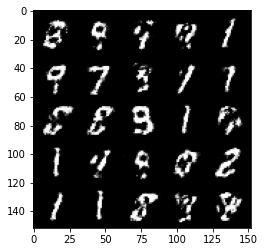

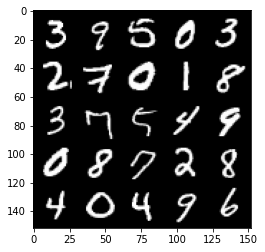

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500: Generator loss: 1.1982707817554477, discriminator loss: 0.5045720817446707


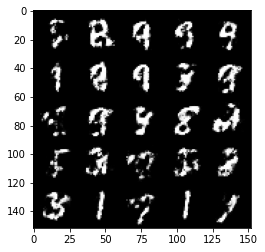

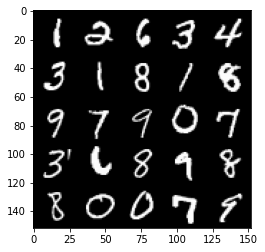

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 1.229671448588372, discriminator loss: 0.4888777495622633


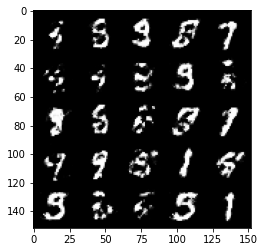

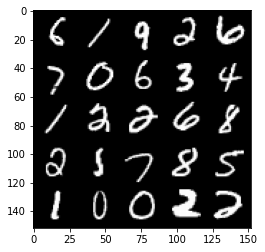

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500: Generator loss: 1.247649654626846, discriminator loss: 0.48210473883151994


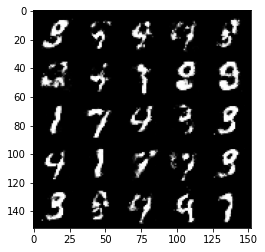

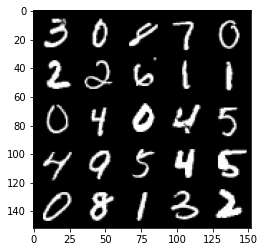

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 1.2368570058345794, discriminator loss: 0.4834659247994423


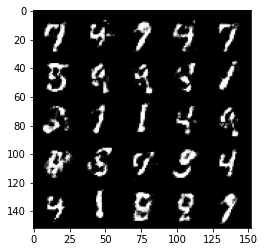

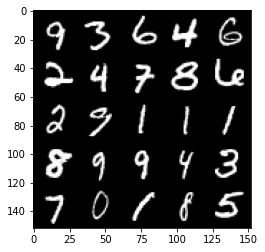

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500: Generator loss: 1.208958999872208, discriminator loss: 0.49704837548732783


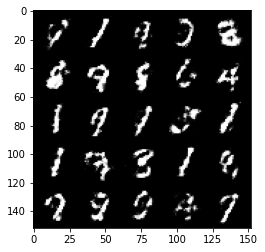

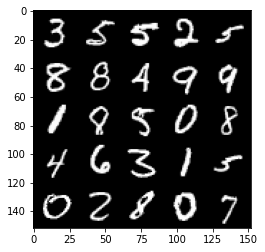

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 1.2191606104373935, discriminator loss: 0.4857457119226456


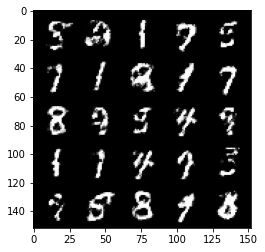

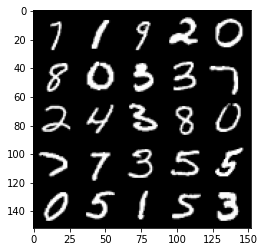

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500: Generator loss: 1.1403163743019091, discriminator loss: 0.5172277370095252


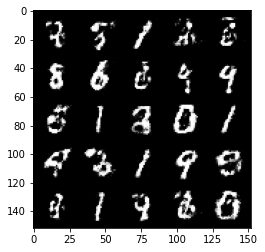

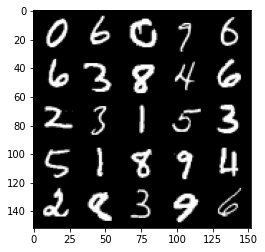

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 1.1545352457761762, discriminator loss: 0.5017964768409733


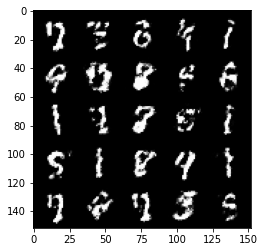

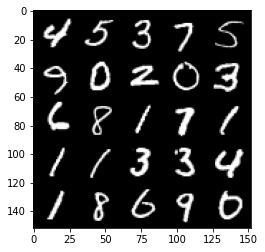

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500: Generator loss: 1.2202945399284364, discriminator loss: 0.4823400542140009


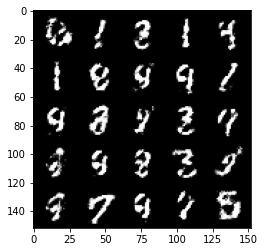

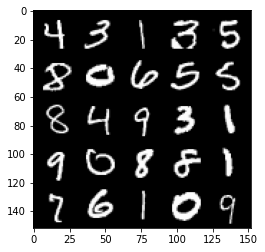

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 1.237714747667312, discriminator loss: 0.4832375791668892


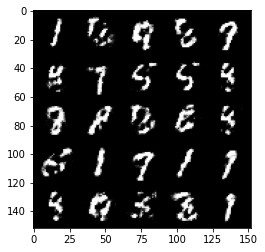

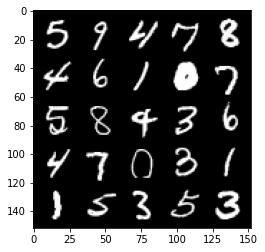

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500: Generator loss: 1.2041439567804346, discriminator loss: 0.4994265610575676


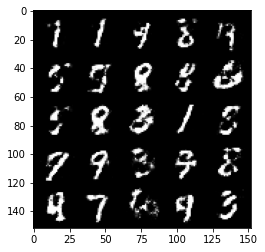

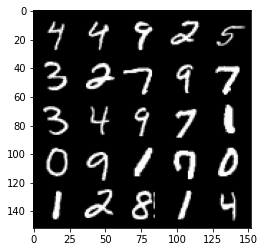

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 1.1539034566879265, discriminator loss: 0.5057164605259893


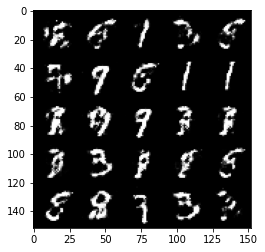

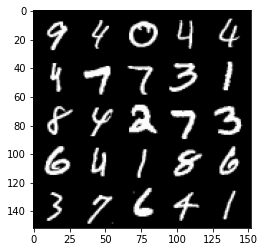

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500: Generator loss: 1.1599518847465513, discriminator loss: 0.5025876321196554


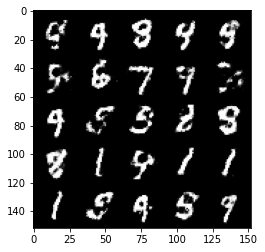

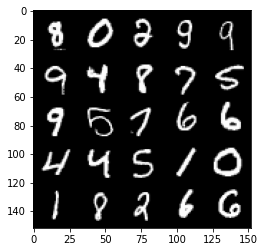

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 1.1965349764823916, discriminator loss: 0.4881319421529768


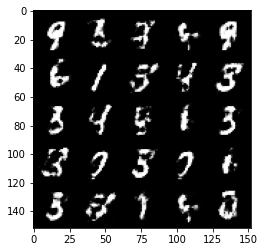

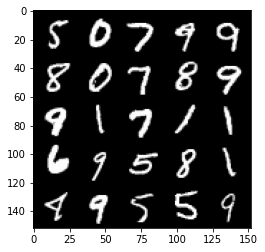

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500: Generator loss: 1.2079211909770964, discriminator loss: 0.49816993713378904


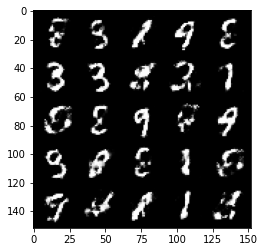

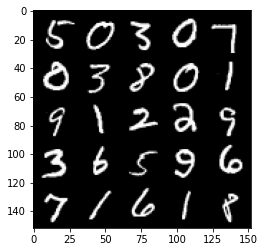

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 1.1754102338552466, discriminator loss: 0.5021044943928716


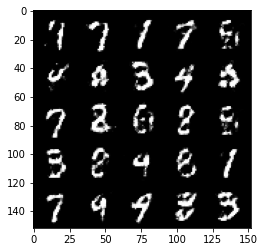

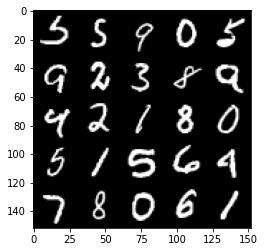

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500: Generator loss: 1.1732424960136416, discriminator loss: 0.5042949384450917


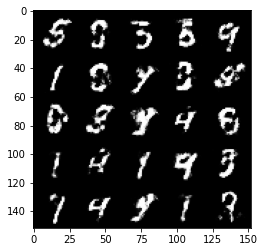

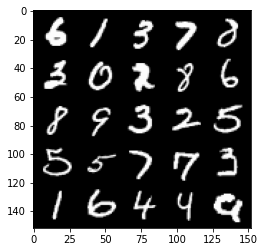

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 1.1469508454799642, discriminator loss: 0.5104908725619315


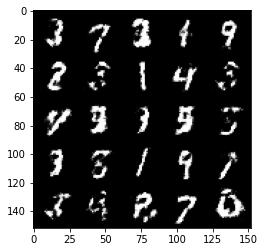

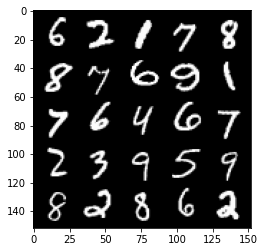

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500: Generator loss: 1.1608912870883943, discriminator loss: 0.5058819820880892


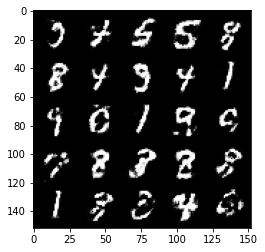

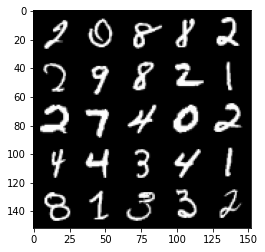

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 1.1555524623394007, discriminator loss: 0.5122161180377


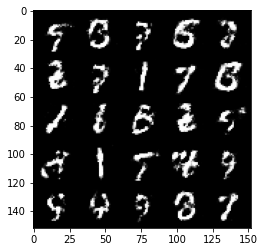

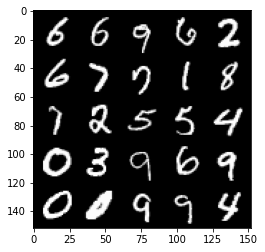

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500: Generator loss: 1.1756484255790713, discriminator loss: 0.5083371764421463


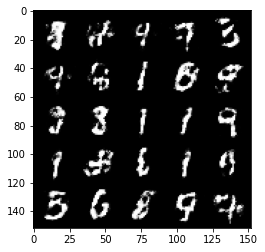

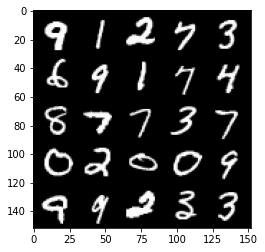

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 1.1539416551589963, discriminator loss: 0.512890669941902


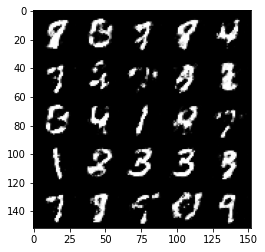

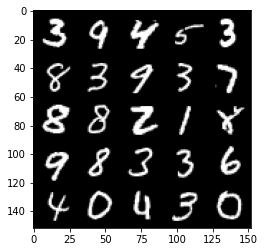

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500: Generator loss: 1.1579490443468092, discriminator loss: 0.5073764736652377


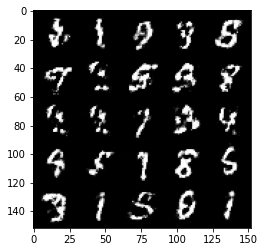

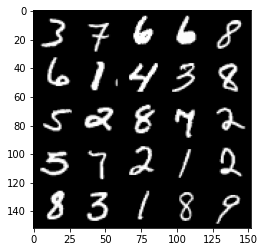

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 1.1467626514434819, discriminator loss: 0.510879011332989


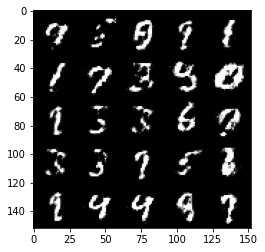

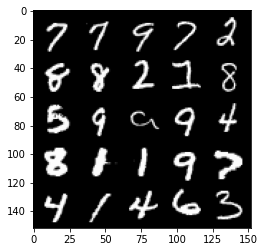

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500: Generator loss: 1.1547170214653013, discriminator loss: 0.5088035142421723


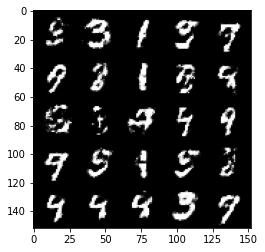

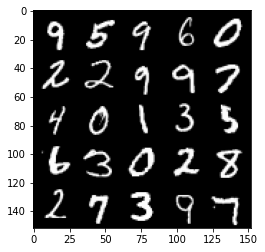

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 1.095087293028831, discriminator loss: 0.5299503311514857


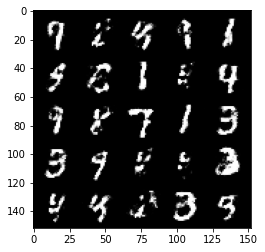

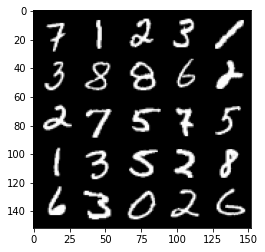

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500: Generator loss: 1.0568449980020522, discriminator loss: 0.5371182931065558


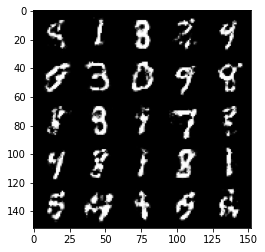

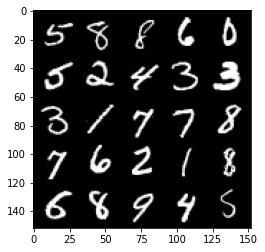

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 1.0881991478204736, discriminator loss: 0.5426073265075678


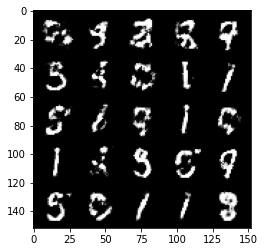

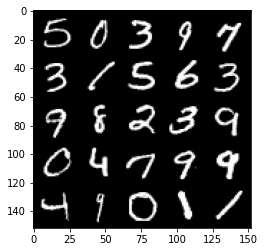

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500: Generator loss: 1.1267483195066446, discriminator loss: 0.5243278979659084


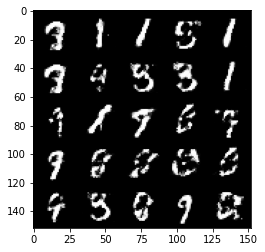

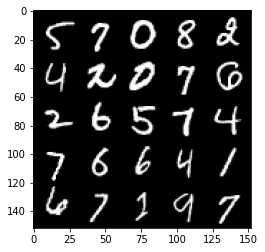

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 1.0615053669214247, discriminator loss: 0.5470929681062694


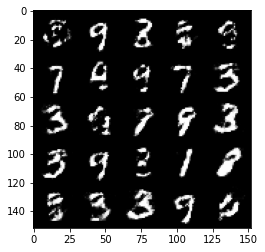

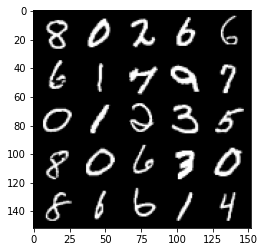

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500: Generator loss: 1.0543899208307264, discriminator loss: 0.5475901833772667


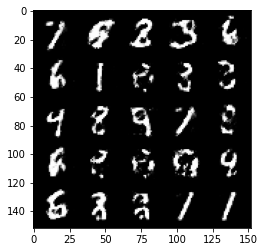

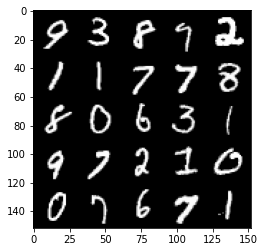

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 1.0000563770532622, discriminator loss: 0.5628932889699942


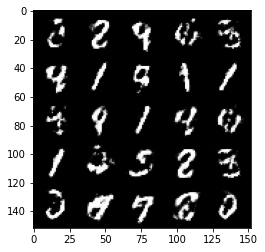

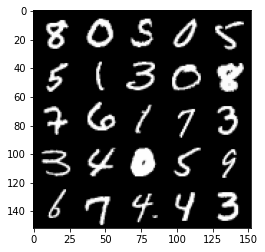

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500: Generator loss: 1.0134201227426527, discriminator loss: 0.5622059250473976


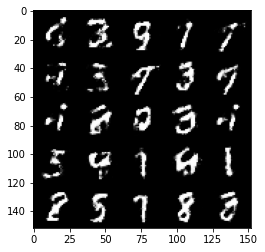

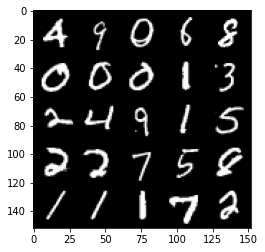

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 0.9693649369478226, discriminator loss: 0.5767028166055675


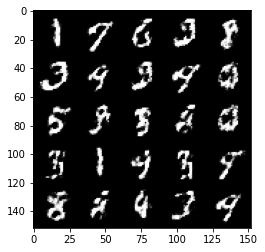

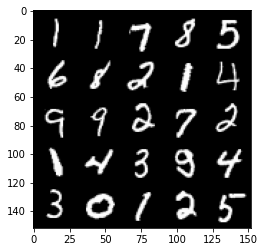

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500: Generator loss: 1.0326418061256426, discriminator loss: 0.5505162498354913


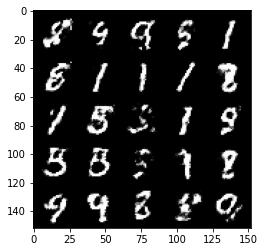

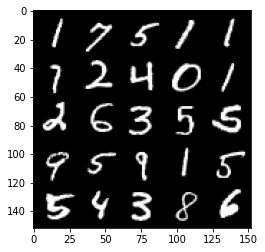

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 1.032635855317116, discriminator loss: 0.5538410322666167


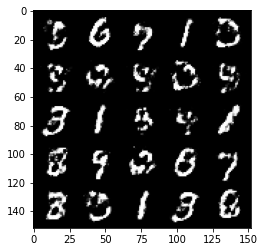

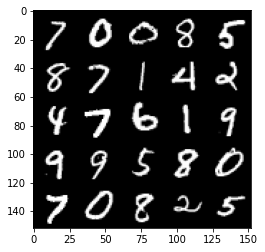

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500: Generator loss: 0.9939915840625758, discriminator loss: 0.5600301994085307


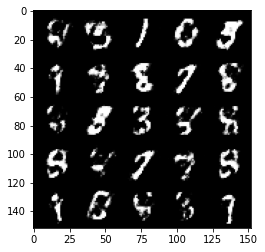

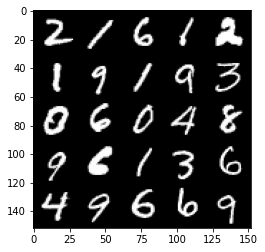

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 1.0446420478820806, discriminator loss: 0.5365847898721692


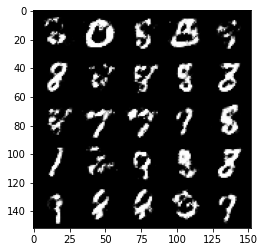

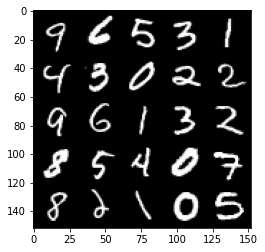

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500: Generator loss: 1.061646063566208, discriminator loss: 0.5379518604874602


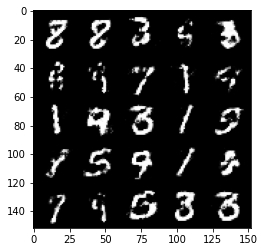

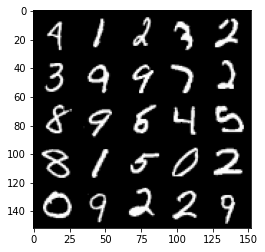

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 0.9968975080251697, discriminator loss: 0.5633938617110249


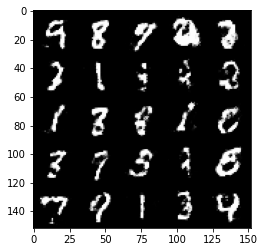

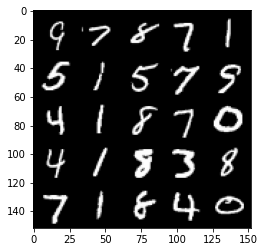

In [ ]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION:

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):

    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1